In [ ]:
# !pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu116

: 

# Hardware Check
### Nvidia

In [2]:
!nvidia-smi

Mon Sep 22 14:10:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 566.03                 Driver Version: 566.03         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   47C    P8              8W /   30W |     374MiB /   4096MiB |      3%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### Utralytics Check:

In [6]:
from IPython import display
import ultralytics

display.clear_output()  # Bersihkan output sebelumnya
ultralytics.checks()    # Periksa instalasi YOLOv8


Ultralytics 8.3.202  Python-3.13.3 torch-2.8.0+cpu CPU (11th Gen Intel Core i5-11400H @ 2.70GHz)
Setup complete  (12 CPUs, 7.8 GB RAM, 165.2/264.4 GB disk)


### CUDA Check:

In [7]:
import torch
x = torch.rand(5, 3)
print(x)

tensor([[0.2905, 0.9618, 0.7675],
        [0.8111, 0.0122, 0.5975],
        [0.8815, 0.9058, 0.1812],
        [0.6604, 0.3062, 0.6406],
        [0.5210, 0.8446, 0.3393]])


In [8]:
import torch
print(torch.version.cuda)
print(torch.cuda.is_available())

None
False


### Inference

##### Using CLI

In [6]:
# !yolo task=segment mode=predict model=Model\best.pt conf=0.25 source=dataset\test save=true show_boxes=true

In [7]:
# import glob
# from IPython.display import Image, display

# for image_path in glob.glob(f'runs/segment/predict/*.png')[:3]:
#       display(Image(filename=image_path, height=600))
#       print("\n")

##### Using Python Code

In [9]:
from PIL import Image as img
from ultralytics import YOLO
import glob
from IPython.display import Image, display
import cv2
import os

In [31]:
model = YOLO('../assets/model/chicken.pt')  
test_images_dir = '../assets/datasets/images/' # Directory containing test images
# Create the Outputs directory if it doesn't exist
outputs_dir = 'Outputs'
if not os.path.exists(outputs_dir):
    os.makedirs(outputs_dir)

all_results = []

for filename in os.listdir(test_images_dir):
    if filename.endswith('.jpg'):
        # Construct full path to the current image
        image_path = os.path.join(test_images_dir, filename)
        # Perform inference on the current image
        result = model(image_path)
        all_results.append(result)

        # Process and save each result
        for r in result:
            im_array = r.plot()  # Get the NumPy array
            im_array = cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            im = img.fromarray(im_array)  # Create PIL Image from NumPy array
            output_filename = f"{os.path.splitext(filename)[0]}_result.jpg"
            output_path = os.path.join(outputs_dir, output_filename)
            im.save(output_path)  # Save the processed image

# Display the result images
for image_path in glob.glob(f'Outputs/*.jpg')[:3]:
    display(Image(filename=image_path, height=600))
print("\n")

FileNotFoundError: [WinError 3] The system cannot find the path specified: '../assets/datasets/images/'

### Weight Estimation

In [13]:
import cv2
import numpy as np

In [15]:
# Print all results for debugging
for idx, result in enumerate(all_results):
    print(f"Results for image {idx + 1}:")
    for r in result:
        boxes = r.boxes  # Detected bounding boxes
        masks = r.masks  # Detected masks, if any
        names = r.names  # Class names
        orig_img = r.orig_img  # Original image
        path = r.path  # Image path

        print(f"Path: {path}")
        print(f"Boxes: {boxes}")
        print(f"Masks: {masks}")
        print(f"Names: {names}")
        print(f"Original Image Shape: {orig_img.shape}")

# Assuming you want to visualize the first result's bounding boxes
if all_results:
    first_result = all_results[0][0]
    boxes = first_result.boxes
    print(f"Bounding Boxes of first result: {boxes}")


##### Calculate the Area of the segmented chickens

In [16]:
# Iterate through the results for each image
for image_index, result in enumerate(all_results):
    print(f"Processing results for image {image_index + 1}:")

    # Initialize a counter for each image
    counter = 1

    # Accessing the boxes, names, and masks for each image
    for r in result:
        boxes = r.boxes.xyxy.cpu().numpy()  # Convert boxes to numpy array
        labels = r.names  # Class names
        masks_data = r.masks.xy if r.masks is not None else []  # Mask data as numpy array if available

        # Iterate through detected objects
        for i, (box, mask) in enumerate(zip(boxes, masks_data)):
            label = labels[0]  # Get the class name, assuming single class 'broiler'
            if label == 'chicken':
                # Create an empty binary mask
                mask_shape = r.orig_img.shape[:2]  # Shape of the original image (height, width)
                mask_binary = np.zeros(mask_shape, dtype=np.uint8)

                # Convert mask segments to polygon format
                polygon = np.array(mask, dtype=np.int32).reshape((-1, 1, 2))

                # Fill the binary mask with the polygon
                cv2.fillPoly(mask_binary, [polygon], 255)

                # Find contours in the mask
                contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

                # Calculate the area of each contour
                area = 0
                for contour in contours:
                    area += cv2.contourArea(contour)
                print(f"Area of {label} {counter}: {area} pixels")
                # Increment counter
                counter += 1
    print("\n")


In [13]:
# print('Names')
# print(labels[0])
# print('--------------------------------------------------------------------------------------')
# print('Box Shape')
# print(boxes)
# print('--------------------------------------------------------------------------------------')
# print('Mask data')
# print(masks_data)

##### Predict the weight of a chicken based on its area

In [19]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as mtp
import seaborn as sns
sns.set()

Matplotlib is building the font cache; this may take a moment.


In [20]:
# Load the data from the CSV file
data = pd.read_csv('../assets/datasets/area_weight.csv')

In [21]:
data.head()

,Area,Weight
0,255869.5,2501
1,126396.0,2336
2,97860.5,2235
3,85622.5,1891
4,76389.5,1747


In [22]:
data.describe()

,Area,Weight
count,32.000000,32.000000
mean,45303.328125,1258.562500
std,47229.521520,468.087594
min,4634.500000,720.000000
25%,20640.375000,940.750000
50%,34655.500000,1140.000000
75%,46852.125000,1451.500000
max,255869.500000,2501.000000


In [23]:
# Split the data into features (X) and target (y)
X = data['Area'].values.reshape(-1, 1)  # Reshape the area column to a 2D array
y = data['Weight'].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the linear regression model
LRmodel = LinearRegression()
LRmodel.fit(X_train, y_train)

# Make predictions on the test set
y_pred = LRmodel.predict(X_test)

# Print the predicted weights for the test set
for area, weight in zip(X_test, y_pred):
    print(f"Area: {area[0]}, Predicted weight: {weight:.2f}")

Area: 6619.0, Predicted weight: 938.19
Area: 36602.5, Predicted weight: 1195.95
Area: 18991.5, Predicted weight: 1044.55
Area: 29565.0, Predicted weight: 1135.45
Area: 46204.0, Predicted weight: 1278.50
Area: 45691.5, Predicted weight: 1274.09
Area: 5706.5, Predicted weight: 930.34


##### Visualizing the Training set results

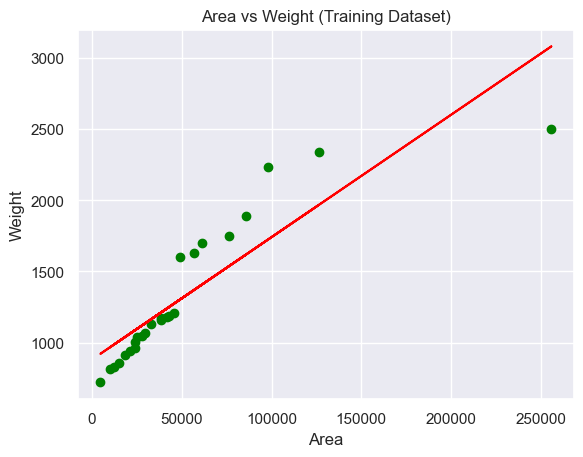

In [24]:
mtp.scatter(X_train, y_train, color="green")
mtp.plot(X_train, LRmodel.predict(X_train), color="red")
mtp.title("Area vs Weight (Training Dataset)")
mtp.xlabel("Area")
mtp.ylabel("Weight")
mtp.show()

##### Visualizing the Test set results

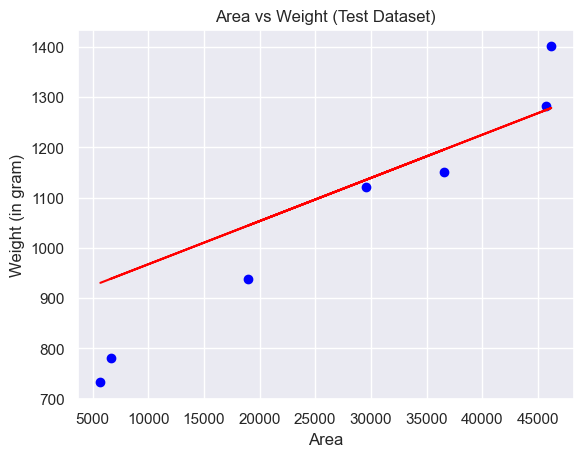

In [25]:
mtp.scatter(X_test, y_test, color="blue")
mtp.plot(X_test, y_pred, color="red")
mtp.title("Area vs Weight (Test Dataset)")
mtp.xlabel("Area")
mtp.ylabel("Weight (in gram)")
mtp.show()

##### Finding the residuals

In [26]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
# print('RMSE:', np.sqrt(metrics.mean_absolute_error(y_test, y_pred)))

MAE: 93.27222729474354
MSE: 13263.38867352696


### Display the image with weights

In [22]:
# Accessing the boxes and names
# boxes = results[0].boxes  # Boxes in Boxes object format
# names = results[0].names  # Class names

In [27]:
# Accessing the boxes and names from the first image result
if all_results:
    first_image_results = all_results[0]  # Get the results for the first image
    if first_image_results:
        first_result = first_image_results[0]  # Get the first result of the first image
        boxes = first_result.boxes  # Boxes in Boxes object format
        names = first_result.names  # Class names

        # Print the boxes and names
        print("Boxes:", boxes)
        print("Class names:", names)
    else:
        print("No results found for the first image.")
else:
    print("No results found in all_results.")


No results found in all_results.


In [28]:
# from IPython.display import clear_output
# import cv2


# img = np.array(img)  # Convert to NumPy array
# # Iterate over the detected chickens
# for i, box in enumerate(boxes):
#     x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())  # Convert coordinates to integers
#     conf = box.conf.item()
#     cls = int(box.cls.item())
#     if names[cls] == 'broiler':
#         area = (x2 - x1) * (y2 - y1)
#         predicted_weight = LRmodel.predict([[area]])  # Predict weight based on area

#         # Draw bounding box and display predicted weight
#         cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
#         cv2.putText(img, f"Weight: {predicted_weight[0]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

# # Display the image with bounding boxes and predicted weights
# cv2.imshow('Image', img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [29]:
def get_boxes_and_names(image_index, all_results):
    """
    Returns the boxes and names for the specified image index.

    Args:
        image_index (int): The index of the image in the all_results list.
        all_results (list): A list containing the object detection results for all images.

    Returns:
        tuple: A tuple containing two lists: (boxes, names).
               boxes (list): A list of bounding box objects (Boxes format).
               names (list): A list of class names corresponding to the detected objects.
    """
    if all_results:
        image_results = all_results[image_index]
        if image_results:
            result = image_results[0]
            boxes = result.boxes
            names = result.names
            return boxes, names
    return [], []

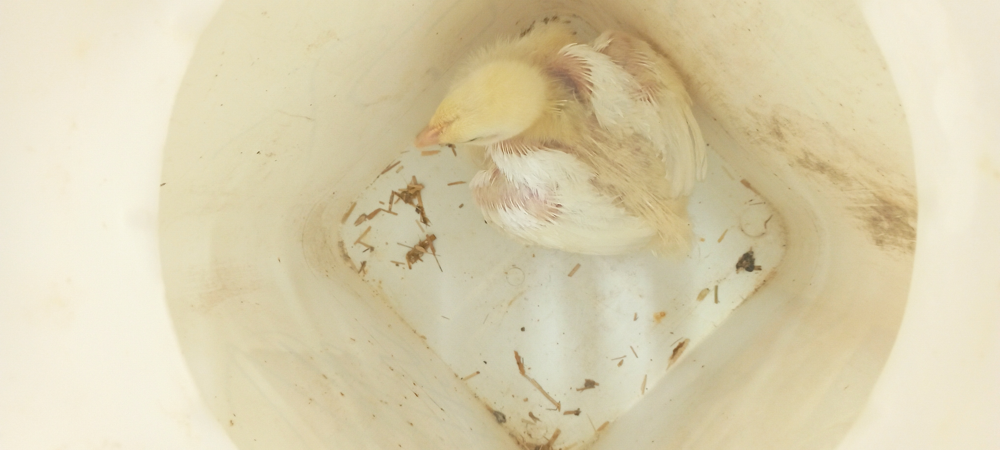

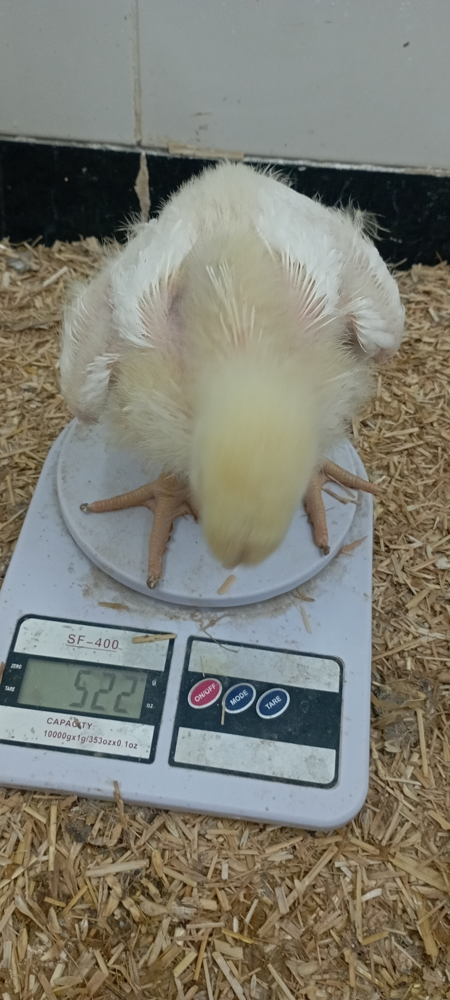

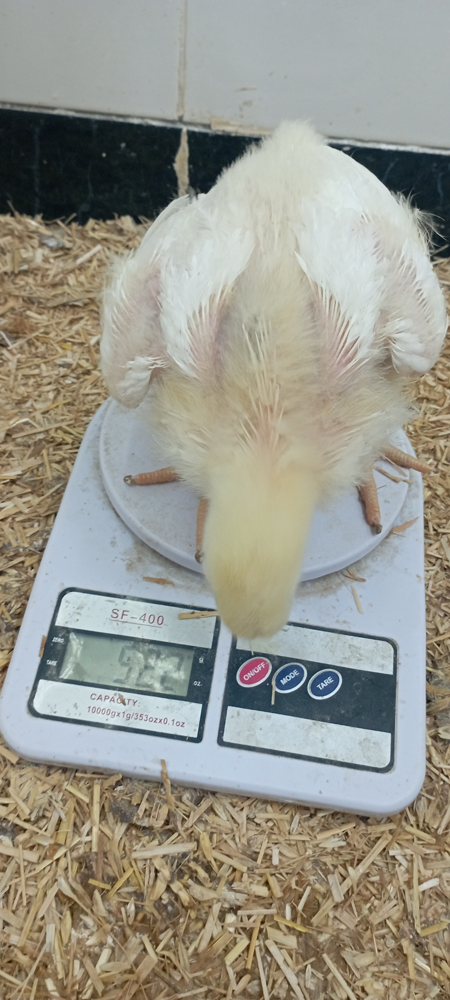

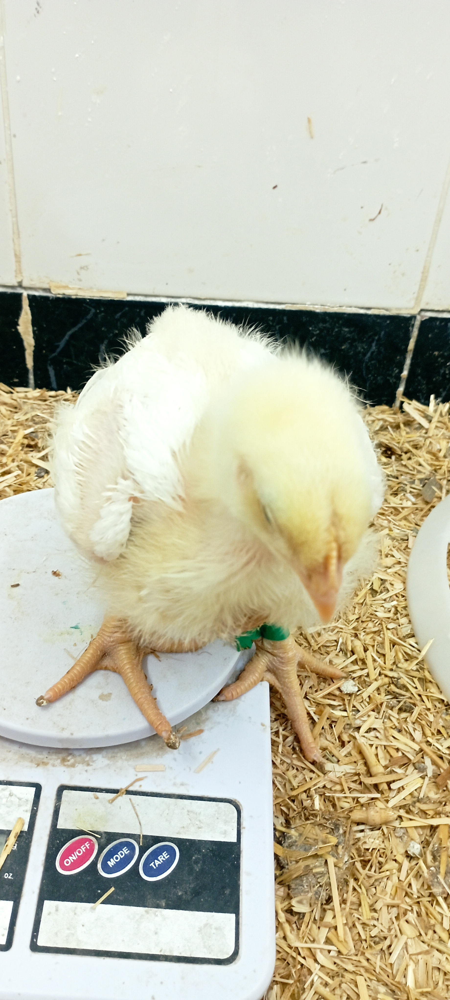

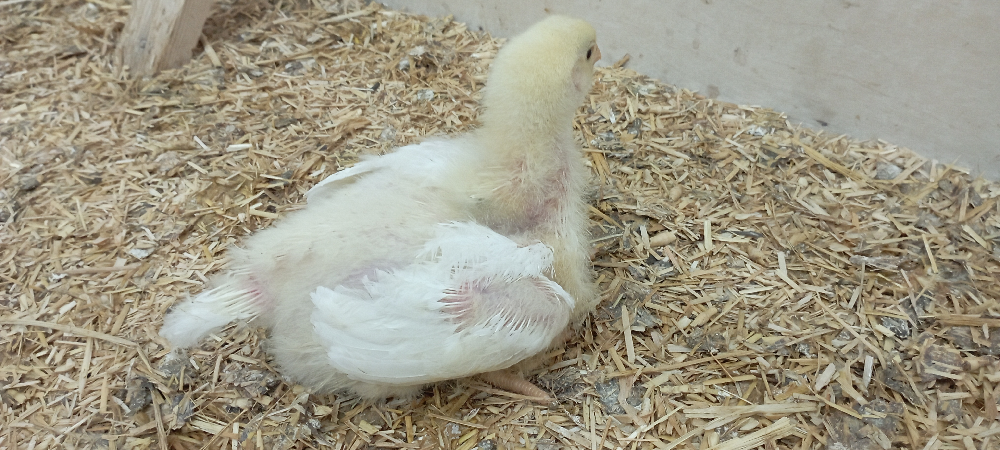

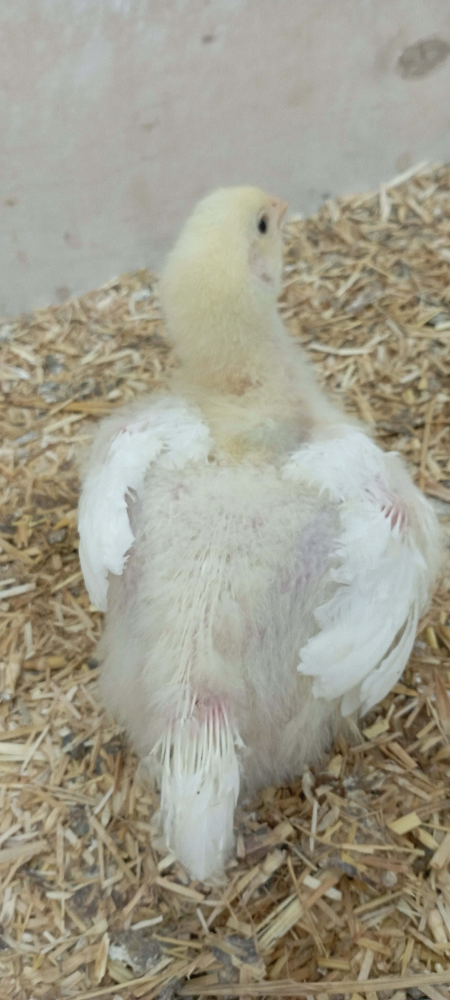

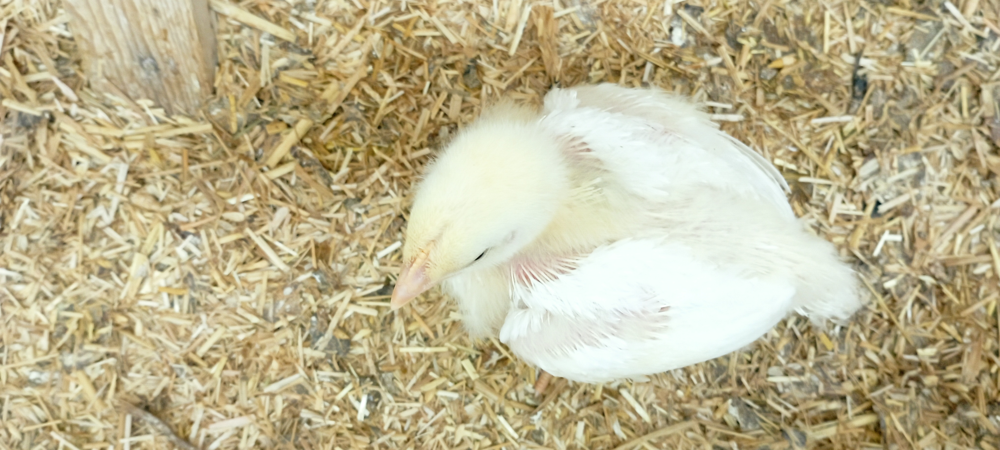

In [34]:
import os
import cv2
from IPython.display import Image, display

# Define the folder containing the images
folder_path = '../assets/datasets/images'

# Create a list of all PNG file paths in the folder
image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg')]

for i, image_path in enumerate(image_files):
    # Load the image
    img = cv2.imread(image_path)

    # Check if the image is loaded successfully
    if img is None:
        print(f"Error: Unable to load image {image_path}")
        continue

    # Get the boxes and names for the current image
    boxes, names = get_boxes_and_names(i, all_results)

    # Iterate over the detected chickens
    for j, box in enumerate(boxes):
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())  # Convert coordinates to integers
        conf = box.conf.item()
        cls = int(box.cls.item())
        if names[cls] == 'chicken':
            area = (x2 - x1) * (y2 - y1)
            predicted_weight = LRmodel.predict([[area]])  # Predict weight based on area

            # Draw bounding box and display predicted weight
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, f"Chicken: {predicted_weight[0]:.2f} g", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        (0, 0, 255), 2)

    # Save the modified image temporarily
    temp_image_path = 'temp_image.jpg'
    cv2.imwrite(temp_image_path, img)

    # Display the image with bounding boxes and predicted weights
    display(Image(temp_image_path))

    # Remove the temporary image file
    os.remove(temp_image_path)